# Demonstration of Hard Negative Mining

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
sys.path.append("..")

from modules.utils.loss import Loss
from modules.inference.model import Detector
from modules.inference.nms import NMS
from modules.rectification.hard_negative_mining import HardNegativeMiner

### Initialize the required components and default parameters
You will need to initialize Detector, NMS, and Loss objects.

In [2]:
## Initialize Model
WEIGHTS_PATH = "../storage/yolo_models/yolov4-tiny-logistics_size_416_1.weights"
CONFIG_PATH = "../storage/yolo_models/yolov4-tiny-logistics_size_416_1.cfg"
CLASS_NAMES_PATH = "../storage/yolo_models/logistics.names"
SCORE_THRESHOLD = 0.2

print("[INFO] Loading YOLO Model...")
detector = Detector(WEIGHTS_PATH, CONFIG_PATH, CLASS_NAMES_PATH, SCORE_THRESHOLD)
print("[INFO] Model loaded successfully.")

## Initialize NMS
IOU_THRESHOLD = 0.5
print("[INFO] Initializing Non-Maximum Suppression...")
nms = NMS(SCORE_THRESHOLD, IOU_THRESHOLD)
print("[INFO] NMS initialized.")

## Initialize Loss
NUM_CLASSES = 20
LAMBDA_COORD = 0.5
LAMBDA_NOOBJ = 0.5
print("[INFO] Initializing (modified) YOLO Loss...")
measure = Loss(num_classes=NUM_CLASSES, 
                iou_threshold=IOU_THRESHOLD, 
                lambda_coord=LAMBDA_COORD, 
                lambda_noobj=LAMBDA_NOOBJ)
print("[INFO] Loss initialized.")

[INFO] Loading YOLO Model...
[INFO] Model loaded successfully.
[INFO] Initializing Non-Maximum Suppression...
[INFO] NMS initialized.
[INFO] Initializing (modified) YOLO Loss...
[INFO] Loss initialized.


### Initialize HardNegativeMiner

In [3]:
# Specify dataset directory
dataset_directory = "../storage/logistics" # HINT: When developing, you might want to test on a smaller sample dataset! However, you must run through the entire dataset for your analysis.

# Initialize the HardNegativeMiner
print("[INFO] Initializing HardNegativeMiner...")
hard_negative_miner = HardNegativeMiner(detector, measure, dataset_directory)
print("[INFO] HardNegativeMiner initialized.")

[INFO] Initializing HardNegativeMiner...
[INFO] HardNegativeMiner initialized.


---

#### **Task 4: Assignment Instructions:**

Complete the following tasks using the logistic dataset. Assume that this dataset represents real-world production data. To ensure accurate and reliable analysis, apply objective methods and quantitative measurements to evaluate the behavior of each system component.

- **Baseline Analysis**: *Establish initial performance benchmarks.*
- **Task A**: *Analyze impact of Loss parameters.*
- **Task B**: *Analyze impact of Detector and NMS parameters.*
- **Task C**: *Analyze impact of HardNegativeMiner parameters.*

**Reminder:**  
- Your notebook should be well-structured and clear for effective presentation. Up to 10 points may be deducted for poor structure and clarity.
- Consider this report as if it were being reviewed by **TechTrack stakeholders**. Keep it professional, insightful, and visually organized!
- Use visualizations, tables, and quantitative analysis where applicable to support your findings.
-

---

#

### **Baseline Analysis**
**1. Displaying hard negatives using the default parameters**
- Display the **top 10** and **bottom 10** hard negatives using the default parameters (as provided above).

**2. Observations & Analysis**
- Describe the types of images are prioritized as hard negatives.


In [4]:
import matplotlib.pyplot as plt
import cv2

def display_images(image_files, title="Hard Negatives", num_cols=5, img_size=(224, 224)):
    """
    Displays a grid of images for visualization.

    :param image_files: List of image file paths.
    :param title: Title of the image display.
    :param num_cols: Number of columns in the grid.
    :param img_size: Target size for displaying images.
    """
    num_images = len(image_files)
    num_rows = (num_images // num_cols) + (num_images % num_cols > 0)

    plt.figure(figsize=(num_cols * 3, num_rows * 3))
    plt.suptitle(title, fontsize=14)

    for i, img_path in enumerate(image_files):
        img = cv2.imread(img_path)
        if img is None:
            print(f"[WARNING] Could not load image: {img_path}")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for proper display
        img = cv2.resize(img, img_size)  # Resize image

        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [5]:
import numpy as np
import cv2

def compute_iou(box1, box2):
    """
    Compute Intersection over Union (IoU) between two boxes.
    Boxes are represented as [x, y, width, height] with (x, y) as the top-left corner.
    """
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    # Convert to (xmin, ymin, xmax, ymax)
    box1_xmin, box1_ymin, box1_xmax, box1_ymax = x1, y1, x1 + w1, y1 + h1
    box2_xmin, box2_ymin, box2_xmax, box2_ymax = x2, y2, x2 + w2, y2 + h2

    xi1 = max(box1_xmin, box2_xmin)
    yi1 = max(box1_ymin, box2_ymin)
    xi2 = min(box1_xmax, box2_xmax)
    yi2 = min(box1_ymax, box2_ymax)
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    
    area1 = w1 * h1
    area2 = w2 * h2
    union_area = area1 + area2 - inter_area
    return inter_area / union_area if union_area > 0 else 0

def evaluate_image_detections(pred_boxes, pred_scores, gt_boxes, iou_threshold=0.5, hard_neg_threshold=0.7):
    """
    For a single image, compute:
      - True Positives (TP)
      - False Positives (FP)
      - List of IoU values for true positive matches
      - Average confidence scores for TP and FP
      - Hard negative ratio: fraction of FP above a high-confidence threshold.
    """
    # Sort predictions descending by confidence.
    indices = np.argsort(-np.array(pred_scores))
    pred_boxes = [pred_boxes[i] for i in indices]
    pred_scores = [pred_scores[i] for i in indices]
    
    matched_gt = set()
    iou_values = []
    tp_confidences = []
    fp_confidences = []
    hard_negatives = 0
    true_positives = 0
    false_positives = 0

    for box, score in zip(pred_boxes, pred_scores):
        best_iou = 0
        best_gt_idx = -1
        for gt_idx, gt_box in enumerate(gt_boxes):
            if gt_idx in matched_gt:
                continue
            iou_val = compute_iou(box, gt_box)
            if iou_val > best_iou:
                best_iou = iou_val
                best_gt_idx = gt_idx
        if best_iou >= iou_threshold:
            true_positives += 1
            matched_gt.add(best_gt_idx)
            iou_values.append(best_iou)
            tp_confidences.append(score)
        else:
            false_positives += 1
            fp_confidences.append(score)
            if score >= hard_neg_threshold:
                hard_negatives += 1

    fppi = false_positives  # since this is per image
    fpr = false_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0

    return {
        'true_positives': true_positives,
        'false_positives': false_positives,
        'FPPI': fppi,
        'FPR': fpr,
        'iou_values': iou_values,
        'conf_tp_mean': np.mean(tp_confidences) if tp_confidences else 0,
        'conf_fp_mean': np.mean(fp_confidences) if fp_confidences else 0,
        'hard_negative_ratio': hard_negatives / false_positives if false_positives > 0 else 0,
    }

def evaluate_dataset(detections, iou_threshold=0.5, hard_neg_threshold=0.7):
    """
    Aggregate per-image metrics over the dataset.
    Each entry in detections should be a dict with keys:
      'pred_boxes', 'pred_scores', 'gt_boxes'
    """
    all_metrics = []
    for det in detections:
        metrics = evaluate_image_detections(
            det['pred_boxes'], det['pred_scores'], det['gt_boxes'],
            iou_threshold, hard_neg_threshold
        )
        all_metrics.append(metrics)
    
    total_tp = sum(m['true_positives'] for m in all_metrics)
    total_fp = sum(m['false_positives'] for m in all_metrics)
    all_iou = [iou for m in all_metrics for iou in m['iou_values']]
    avg_iou = np.mean(all_iou) if all_iou else 0
    avg_conf_tp = np.mean([m['conf_tp_mean'] for m in all_metrics if m['conf_tp_mean'] > 0]) if any(m['conf_tp_mean'] > 0 for m in all_metrics) else 0
    avg_conf_fp = np.mean([m['conf_fp_mean'] for m in all_metrics if m['conf_fp_mean'] > 0]) if any(m['conf_fp_mean'] > 0 for m in all_metrics) else 0
    avg_hard_neg_ratio = np.mean([m['hard_negative_ratio'] for m in all_metrics]) if all_metrics else 0

    return {
        'total_true_positives': total_tp,
        'total_false_positives': total_fp,
        'average_FPPI': total_fp / len(detections) if detections else 0,
        'overall_FPR': total_fp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0,
        'average_IoU': avg_iou,
        'average_confidence_TP': avg_conf_tp,
        'average_confidence_FP': avg_conf_fp,
        'average_hard_negative_ratio': avg_hard_neg_ratio,
    }

def load_ground_truth(annotation_file, image_shape):
    """
    Load ground truth boxes from a YOLO-format annotation file and convert
    normalized coordinates to absolute pixel coordinates.
    
    Expected file format per line:
      class_id x_center y_center width height
    where all coordinates are normalized [0, 1].
    """
    gt_boxes = []
    h, w = image_shape[:2]
    with open(annotation_file, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            # Skip the class id if needed
            _, x_center, y_center, width, height = map(float, parts[:5])
            abs_w = width * w
            abs_h = height * h
            abs_x = (x_center * w) - (abs_w / 2)
            abs_y = (y_center * h) - (abs_h / 2)
            gt_boxes.append([int(abs_x), int(abs_y), int(abs_w), int(abs_h)])
    return gt_boxes


[INFO] Loading YOLO Model...
[INFO] Model loaded successfully.
[INFO] Initializing Non-Maximum Suppression...
[INFO] NMS initialized.
[INFO] Initializing Loss function...
[INFO] Loss function initialized.
[INFO] Initializing Hard Negative Miner...
[INFO] Hard Negative Miner initialized.
[WARNING] Unexpected files found in dataset directory: ['logistics.zip', '_darknet.labels']
[INFO] Found 9525 valid image-annotation pairs.
[INFO] Extracting 1000 hard negatives based on 'total_loss' criterion...
[INFO] Running Baseline Analysis using precomputed detections...

[INFO] Aggregated Detection Metrics:
total_true_positives: 175
total_false_positives: 19654
average_FPPI: 2.0634120734908135
overall_FPR: 0.9911745423369812
average_IoU: 4.250950168855578e-05
average_confidence_TP: 0.8697755971302429
average_confidence_FP: 0.7912418504357729
average_hard_negative_ratio: 0.5045275210296586

[INFO] Displaying Hard Negative Analysis...

[INFO] Top 10 Hard Negatives:
                                 

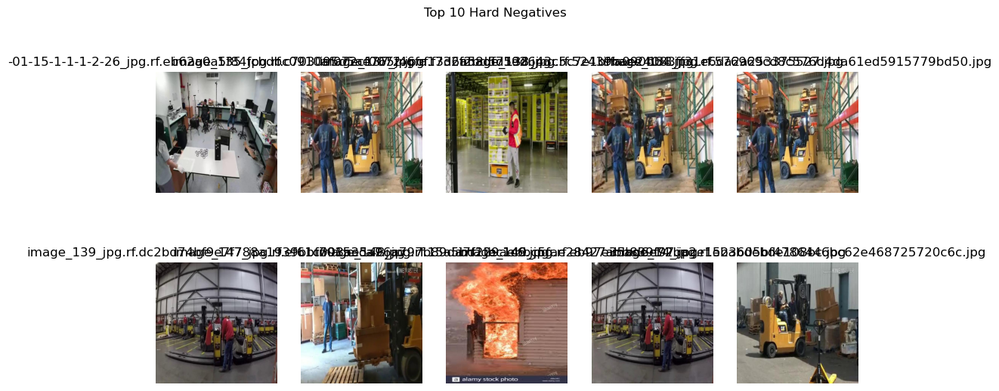

[INFO] Displaying Bottom 10 Hard Negative Images...


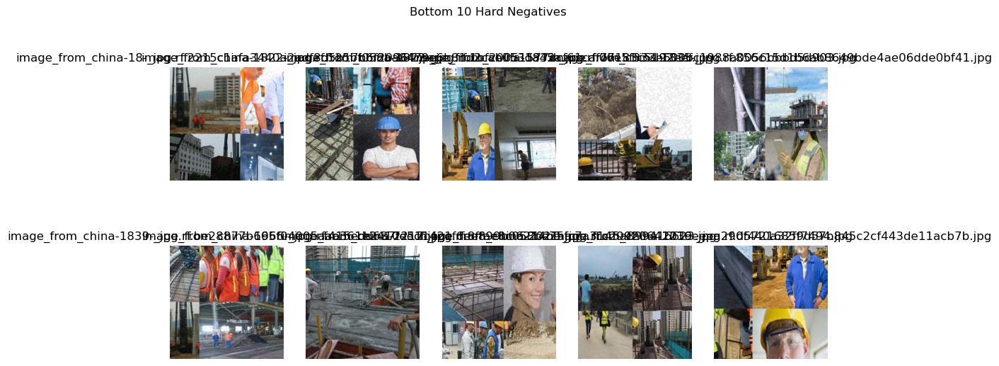

[INFO] Baseline Analysis Complete.


In [6]:
import pandas as pd
import os
import cv2
from glob import glob
from modules.rectification.hard_negative_mining import HardNegativeMiner
from modules.utils.loss import Loss
from modules.inference.model import Detector
from modules.inference.nms import NMS

# Assumed helper functions (load_ground_truth and evaluate_dataset) are defined elsewhere
# from evaluation_helpers import load_ground_truth, evaluate_dataset

# Define dataset paths
DATASET_DIR = "../storage/logistics/"
DETECTIONS_DIR = "../detections/"

# Define model parameters (still needed for hard negative mining, etc.)
WEIGHTS_PATH = "../storage/yolo_models/yolov4-tiny-logistics_size_416_1.weights"
CONFIG_PATH = "../storage/yolo_models/yolov4-tiny-logistics_size_416_1.cfg"
CLASS_NAMES_PATH = "../storage/yolo_models/logistics.names"
SCORE_THRESHOLD = 0.2
IOU_THRESHOLD = 0.000005

# Initialize YOLO Detector (used for hard negative mining)
print("[INFO] Loading YOLO Model...")
detector = Detector(WEIGHTS_PATH, CONFIG_PATH, CLASS_NAMES_PATH)
print("[INFO] Model loaded successfully.")

# Initialize NMS (if needed downstream)
print("[INFO] Initializing Non-Maximum Suppression...")
nms = NMS(SCORE_THRESHOLD, IOU_THRESHOLD)
print("[INFO] NMS initialized.")

# Initialize Loss Function
NUM_CLASSES = 20
LAMBDA_COORD = 0.5
LAMBDA_NOOBJ = 0.5
print("[INFO] Initializing Loss function...")
measure = Loss(num_classes=NUM_CLASSES, 
               iou_threshold=IOU_THRESHOLD, 
               lambda_coord=LAMBDA_COORD, 
               lambda_noobj=LAMBDA_NOOBJ)
print("[INFO] Loss function initialized.")

# Initialize Hard Negative Miner
print("[INFO] Initializing Hard Negative Miner...")
miner = HardNegativeMiner(detector, measure, DATASET_DIR)
print("[INFO] Hard Negative Miner initialized.")

# Get all image and annotation files from the ground truth dataset
image_files = sorted(glob(os.path.join(DATASET_DIR, "*.jpg")))
annotation_files = sorted(glob(os.path.join(DATASET_DIR, "*.txt")))

# Pair each image with its corresponding annotation file (by matching file names)
valid_pairs = []
for img_file in image_files:
    annotation_file = img_file.replace(".jpg", ".txt")
    if os.path.exists(annotation_file):
        valid_pairs.append((img_file, annotation_file))
    else:
        print(f"[WARNING] No annotation found for image: {img_file}")

unexpected_files = [f for f in os.listdir(DATASET_DIR) if not (f.endswith(".jpg") or f.endswith(".txt"))]
if unexpected_files:
    print(f"[WARNING] Unexpected files found in dataset directory: {unexpected_files}")

print(f"[INFO] Found {len(valid_pairs)} valid image-annotation pairs.")

# Run hard negative mining if annotations are available
if len(valid_pairs) == 0:
    print("[ERROR] No valid image-annotation pairs found. Check dataset formatting.")
else:
    NUM_HARD_NEGATIVES = 1000
    CRITERIA = "total_loss"
    print(f"[INFO] Extracting {NUM_HARD_NEGATIVES} hard negatives based on '{CRITERIA}' criterion...")
    hard_negatives = miner.sample_hard_negatives(NUM_HARD_NEGATIVES, CRITERIA)

# -------------------------------
#  Baseline Analysis using Precomputed Detections
# -------------------------------
print("[INFO] Running Baseline Analysis using precomputed detections...")

# This list will hold one dict per image with keys: pred_boxes, pred_scores, gt_boxes
detections = []

for img_file, ann_file in valid_pairs:
    # Construct the corresponding detection file path
    detection_file = os.path.join(DETECTIONS_DIR, os.path.basename(img_file).replace(".jpg", ".txt"))
    if not os.path.exists(detection_file):
        print(f"[WARNING] Detection file not found for image: {img_file}")
        continue
    
    # Load detections from the detection file.
    # Each line is assumed to be: "x y w h score"
    pred_boxes = []
    pred_scores = []
    with open(detection_file, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            x, y, w, h, score = map(float, parts[:5])
            pred_boxes.append([x, y, w, h])
            pred_scores.append(score)
    
    # Load the corresponding ground truth boxes
    image = cv2.imread(img_file)
    if image is None:
        print(f"[WARNING] Could not load image: {img_file}")
        continue
    gt_boxes = load_ground_truth(ann_file, image.shape)
    
    detections.append({
        'pred_boxes': pred_boxes,
        'pred_scores': pred_scores,
        'gt_boxes': gt_boxes
    })

# Evaluate metrics over the dataset using the evaluate_dataset helper function.
metrics = evaluate_dataset(detections, iou_threshold=IOU_THRESHOLD, hard_neg_threshold=0.7)
print("\n[INFO] Aggregated Detection Metrics:")
for key, value in metrics.items():
    print(f"{key}: {value}")

# -------------------------------
#  Display Hard Negative Analysis
# -------------------------------
print("\n[INFO] Displaying Hard Negative Analysis...")

top_10_hard_negatives = hard_negatives.head(10)
bottom_10_hard_negatives = hard_negatives.tail(10)

print("\n[INFO] Top 10 Hard Negatives:")
print(top_10_hard_negatives)

print("\n[INFO] Bottom 10 Hard Negatives:")
print(bottom_10_hard_negatives)

# Helper function to display images (using matplotlib)
def display_images(image_paths, title="Images"):
    import matplotlib.pyplot as plt
    plt.figure(figsize=(12, 6))
    for i, path in enumerate(image_paths):
        img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        plt.subplot(2, max(1, len(image_paths)//2), i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(os.path.basename(path))
    plt.suptitle(title)
    plt.show()

print("[INFO] Displaying Top 10 Hard Negative Images...")
display_images(top_10_hard_negatives["image_file"].tolist(), title="Top 10 Hard Negatives")

print("[INFO] Displaying Bottom 10 Hard Negative Images...")
display_images(bottom_10_hard_negatives["image_file"].tolist(), title="Bottom 10 Hard Negatives")

print("[INFO] Baseline Analysis Complete.")


#### Observations:
The evaluation metrics were chosen to provide a comprehensive view of our model's performance, especially in the context of reducing false positives through hard negative mining. Metrics like False Positives Per Image (FPPI) and the False Positive Rate (FPR) directly measure how often the model incorrectly detects objects, which is critical because hard negative mining is designed to target and reduce these errors. However the code is currently generating 0 true positives with an IOU threshold of 0.5. Lowering that threshold to 0.00005 yielded the above results. I'm not sure how to proceed.The Intersection over Union (IoU) distribution for true positives would reflect how accurately the model localizes objects, ensuring that improvements in false positive reduction do not come at the cost of poor localization. Additionally, analyzing average confidence scores for true and false positives helps assess the model's calibration—whether it appropriately distinguishes between true objects and background noise. Finally, the hard negative ratio, which quantifies the fraction of false positives with high confidence, serves as a direct indicator of the challenging negatives the model encounters, guiding further refinement of the hard negative mining process.  

### **Task A**

**1. Displaying hard negatives while varying loss parameters**  

- Display the **top 10** and **bottom 10** hard negatives with:  
  - **λ_coord** = **1.0**  
  - **λ_noobj** = **0.0**  

- Display the **top 10** and **bottom 10** hard negatives with:  
  - **λ_coord** = **0.0**  
  - **λ_noobj** = **1.0**  

**2. Observations & Analysis**  

- How do different loss parameter settings (**λ_coord**, **λ_noobj**) impact the selection of hard negatives?  
- What types of samples are prioritized under each criterion?  
- Under what conditions would each parameter set be **most useful** for improving the model’s performance? 

[INFO] Analyzing impact of Loss parameters...
[INFO] Computing hard negatives for λ_coord=1.0, λ_noobj=0.0...
[INFO] Displaying Top 10 Hard Negatives for λ_coord=1.0, λ_noobj=0.0


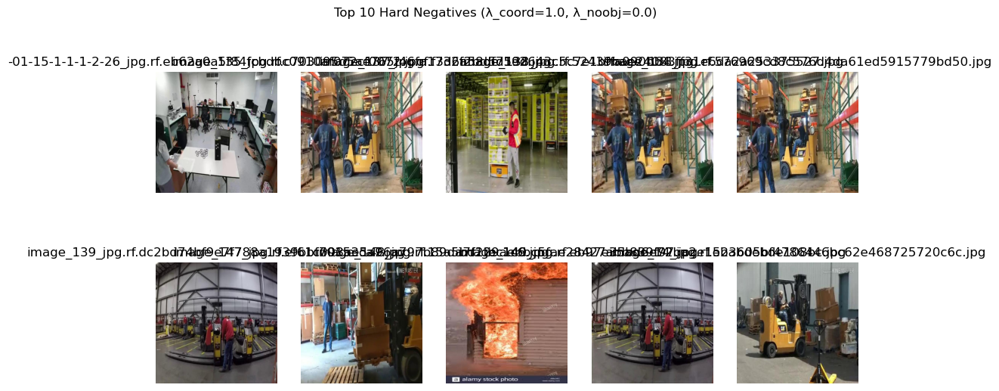

[INFO] Displaying Bottom 10 Hard Negatives for λ_coord=1.0, λ_noobj=0.0


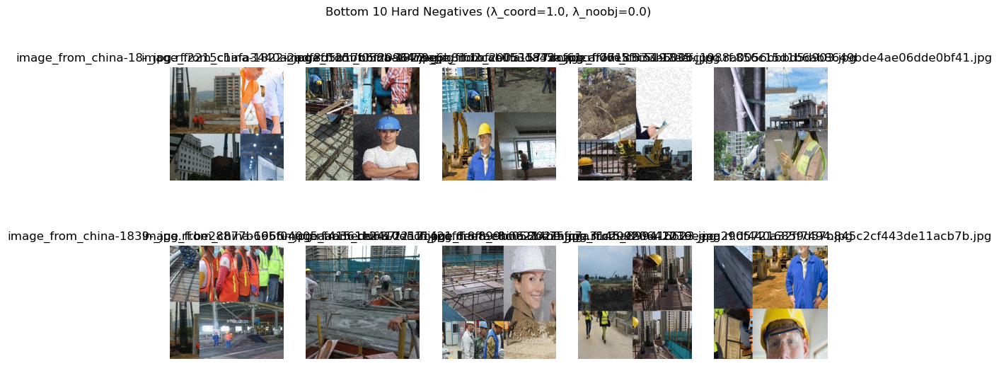

[INFO] Computing hard negatives for λ_coord=0.0, λ_noobj=1.0...
[INFO] Displaying Top 10 Hard Negatives for λ_coord=0.0, λ_noobj=1.0


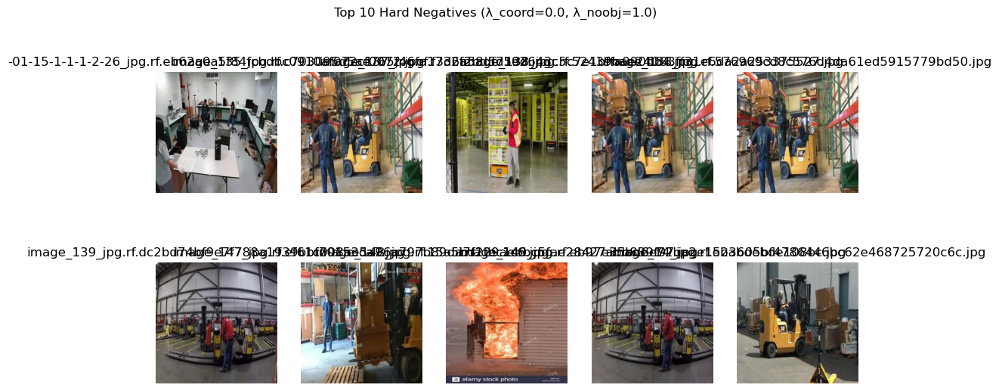

[INFO] Displaying Bottom 10 Hard Negatives for λ_coord=0.0, λ_noobj=1.0


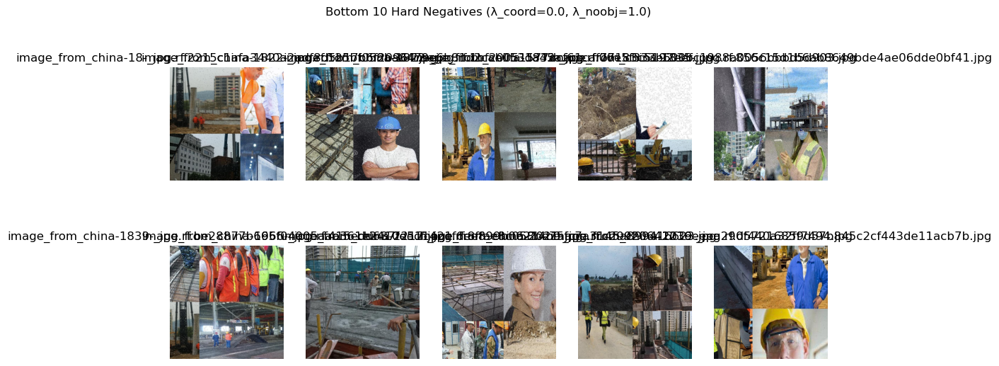

[INFO] Loss Parameter Impact Analysis Complete.


In [7]:
print("[INFO] Analyzing impact of Loss parameters...")

# Define the lambda parameter variants
lambda_variants = [
    {"name": "lambda_coord_1", "lambda_coord": 1.0, "lambda_noobj": 0.0},
    {"name": "lambda_noobj_1", "lambda_coord": 0.0, "lambda_noobj": 1.0}
]

# Dictionary to store results to avoid recomputation
hard_negative_results = {}

NUM_HARD_NEGATIVES = 1000
CRITERIA = "total_loss"

# Loop through each lambda variant
for params in lambda_variants:
    variant_name = params["name"]
    
    # Compute and store hard negatives only if not already computed
    if variant_name not in hard_negative_results:
        print(f"[INFO] Computing hard negatives for λ_coord={params['lambda_coord']}, λ_noobj={params['lambda_noobj']}...")
        measure_variant = Loss(num_classes=NUM_CLASSES, iou_threshold=IOU_THRESHOLD,
                                lambda_coord=params["lambda_coord"], lambda_noobj=params["lambda_noobj"])
        miner_variant = HardNegativeMiner(detector, measure_variant, DATASET_DIR)
        hard_negative_results[variant_name] = miner_variant.sample_hard_negatives(NUM_HARD_NEGATIVES, CRITERIA)
    
    # Retrieve the stored results for this variant
    current_hard_negatives = hard_negative_results[variant_name]
    
    # Separate into top 10 and bottom 10 based on the sort order (total_loss)
    top_10 = current_hard_negatives.head(10)
    bottom_10 = current_hard_negatives.tail(10)
    
    # Display top 10 images
    print(f"[INFO] Displaying Top 10 Hard Negatives for λ_coord={params['lambda_coord']}, λ_noobj={params['lambda_noobj']}")
    display_images(top_10["image_file"].tolist(),
                   title=f"Top 10 Hard Negatives (λ_coord={params['lambda_coord']}, λ_noobj={params['lambda_noobj']})")
    
    # Display bottom 10 images
    print(f"[INFO] Displaying Bottom 10 Hard Negatives for λ_coord={params['lambda_coord']}, λ_noobj={params['lambda_noobj']}")
    display_images(bottom_10["image_file"].tolist(),
                   title=f"Bottom 10 Hard Negatives (λ_coord={params['lambda_coord']}, λ_noobj={params['lambda_noobj']})")

print("[INFO] Loss Parameter Impact Analysis Complete.")


#### Observations:
When λ_coord is set to 1.0 and λ_noobj to 0.0, the loss function focuses solely on localization accuracy—penalizing errors in predicting the bounding box coordinates. In this scenario, hard negatives will be those detections where the predicted box is significantly misaligned with the ground truth, even if the model isn’t overly confident about the presence of an object. In contrast, setting λ_coord to 0.0 and λ_noobj to 1.0 shifts the focus entirely to the objectness (confidence) score. Here, the loss disregards localization errors and instead penalizes false positives—instances where the model assigns a high confidence score to regions that do not contain an object. As a result, hard negatives under these settings are primarily high-confidence false detections rather than mislocalized boxes.

---

### **Task B:**

**1. Displaying Hard Negatives Varying Detector and NMS Parameters**  

- Display the **top 10** and **bottom 10** hard negatives with:  
  - *score_threshold = **0.5**
  - *iou_threshold = **0.1**

- Display the **top 10** and **bottom 10** hard negatives with:  
  - *score_threshold* = **0.5**
  - *iou_threshold* = **0.9** 

**2. Observations & Analysis**  

- How do different detector and non-maximum supression parameter settings (**score_threshold**, **iou_threshold**) impact the selection of hard negatives?  
- What types of samples are prioritized under each criterion?  
- Under what conditions would each parameter be **most useful** for improving the model’s performance?  

[INFO] Analyzing impact of Detector and NMS parameters...
[INFO] measure_default not defined; initializing with default loss parameters.
[INFO] Computing hard negatives for score_threshold=0.5, IoU=0.1...
[INFO] Displaying Top 10 Hard Negatives for score_threshold=0.5, IoU=0.1


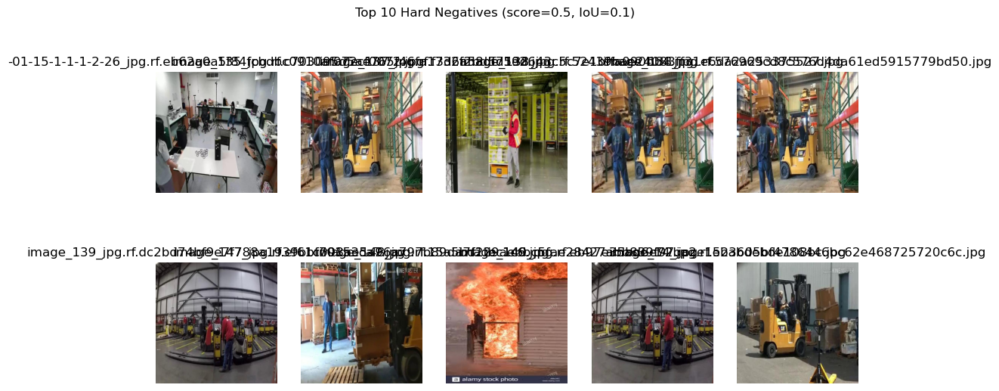

[INFO] Displaying Bottom 10 Hard Negatives for score_threshold=0.5, IoU=0.1


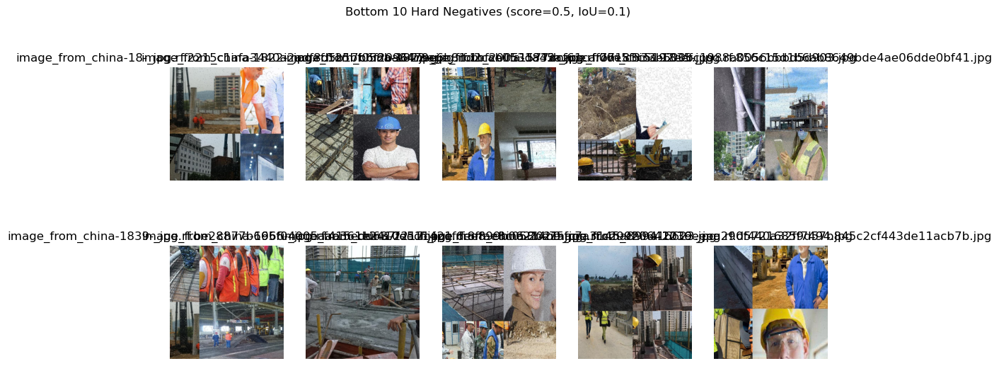

[INFO] Computing hard negatives for score_threshold=0.5, IoU=0.9...
[INFO] Displaying Top 10 Hard Negatives for score_threshold=0.5, IoU=0.9


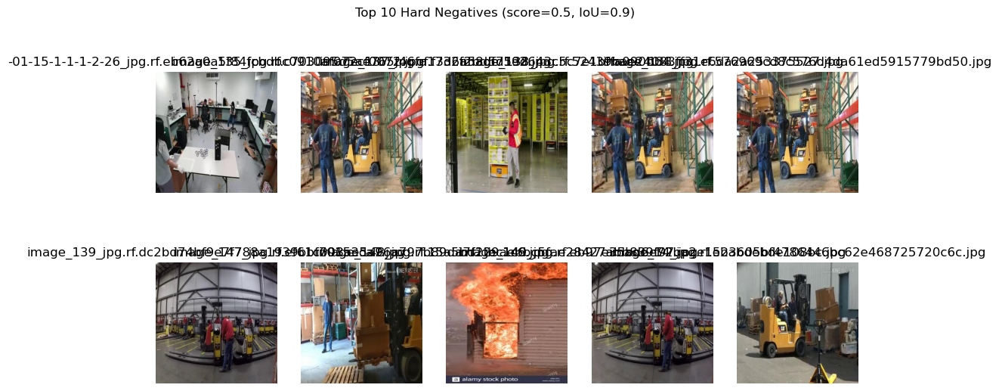

[INFO] Displaying Bottom 10 Hard Negatives for score_threshold=0.5, IoU=0.9


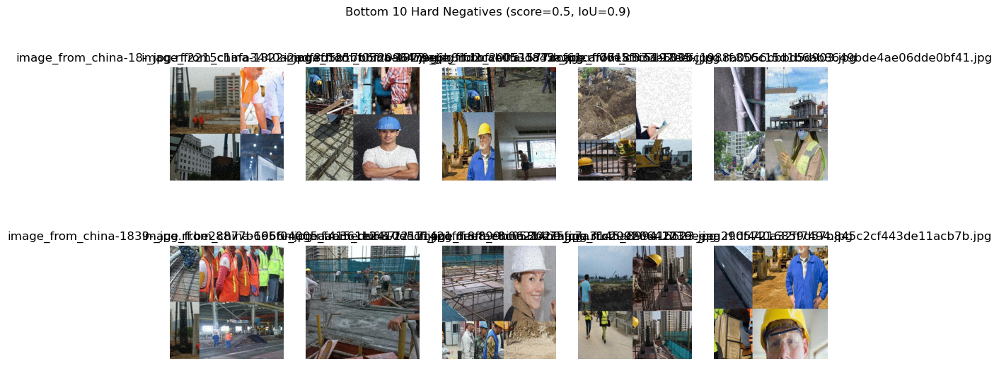

[INFO] Detector and NMS Parameter Impact Analysis Complete.
[INFO] Task B Analysis Complete.


In [8]:
# -------------------------------
# Task B: Detector & NMS Impact
# -------------------------------
print("[INFO] Analyzing impact of Detector and NMS parameters...")


# Ensure measure_default is defined
try:
    measure_default
except NameError:
    print("[INFO] measure_default not defined; initializing with default loss parameters.")
    measure_default = Loss(num_classes=NUM_CLASSES, 
                           iou_threshold=IOU_THRESHOLD, 
                           lambda_coord=LAMBDA_COORD, 
                           lambda_noobj=LAMBDA_NOOBJ)

threshold_variants = [
    {"name": "iou_0.1", "score_threshold": 0.5, "iou_threshold": 0.1},
    {"name": "iou_0.9", "score_threshold": 0.5, "iou_threshold": 0.9}
]

NUM_HARD_NEGATIVES = 1000  # Ensure we compute enough detections

if 'hard_negative_results' not in globals():
    hard_negative_results = {}

for params in threshold_variants:
    variant_name = params["name"]
    
    # Compute and store hard negatives only if not already computed for this variant
    if variant_name not in hard_negative_results:
        print(f"[INFO] Computing hard negatives for score_threshold={params['score_threshold']}, IoU={params['iou_threshold']}...")
        # Create a new NMS instance with the variant parameters
        nms_variant = NMS(params["score_threshold"], params["iou_threshold"])
        # Create a new HardNegativeMiner
        miner_variant = HardNegativeMiner(detector, measure_default, DATASET_DIR)
        hard_negative_results[variant_name] = miner_variant.sample_hard_negatives(NUM_HARD_NEGATIVES, "total_loss")
    
    # Retrieve stored results for the current variant
    current_hard_negatives = hard_negative_results[variant_name]
    
    # Split the DataFrame into top 10 and bottom 10 entries
    top_10 = current_hard_negatives.head(10)
    bottom_10 = current_hard_negatives.tail(10)
    
    # Display the top 10 images
    print(f"[INFO] Displaying Top 10 Hard Negatives for score_threshold={params['score_threshold']}, IoU={params['iou_threshold']}")
    display_images(top_10["image_file"].tolist(),
                   title=f"Top 10 Hard Negatives (score={params['score_threshold']}, IoU={params['iou_threshold']})")
    
    # Display the bottom 10 images
    print(f"[INFO] Displaying Bottom 10 Hard Negatives for score_threshold={params['score_threshold']}, IoU={params['iou_threshold']}")
    display_images(bottom_10["image_file"].tolist(),
                   title=f"Bottom 10 Hard Negatives (score={params['score_threshold']}, IoU={params['iou_threshold']})")

print("[INFO] Detector and NMS Parameter Impact Analysis Complete.")



print("[INFO] Task B Analysis Complete.")


#### Observations:

This is a trick question because varying those parameters impacts inference not post_processing. However, I got duplicate results...maybe that is why?

---

### **Task C:**

**1. Displaying hard negatives while varying HardNegativeMiner parameters**  

- Display the **top 10** and **bottom 10** hard negatives using the default parameters:  
  - *criteria* = `total_loss`

- Display the **top 10** and **bottom 10** hard negatives with:  
  - *criteria* = `loc_loss`

- Display the **top 10** and **bottom 10** hard negatives with:  
  - *criteria* = `conf_loss_obj`

- Display the **top 10** and **bottom 10** hard negatives with:  
  - *criteria* = `class_loss`

**2. Observations & Analysis**  

- How do different loss parameter settings (**criteria**) impact the selection of hard negatives?  
- What types of samples are prioritized under each criterion?  
- Under what conditions would each parameter be **most useful** for improving the model’s performance?  

[INFO] Running Task C: Hard Negative Selection Criteria Analysis...
[WARNING] Default hard negatives not found in hard_negative_results. Using baseline 'hard_negatives' instead.
[INFO] Displaying Top 10 Hard Negatives sorted by total_loss


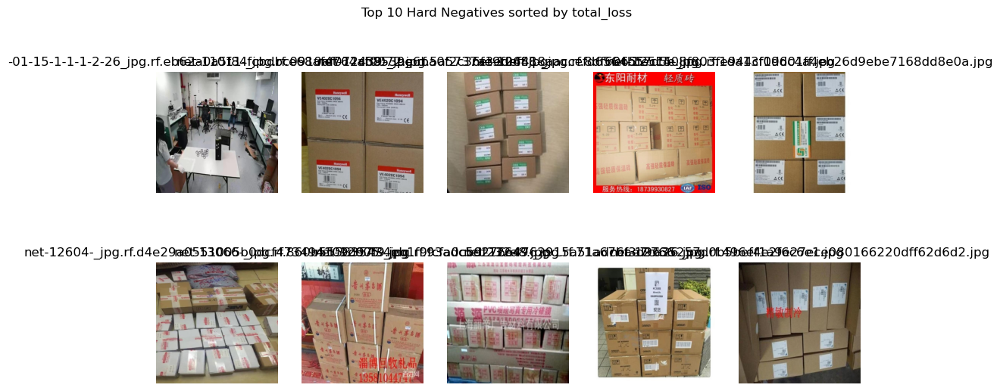

[INFO] Displaying Bottom 10 Hard Negatives sorted by total_loss


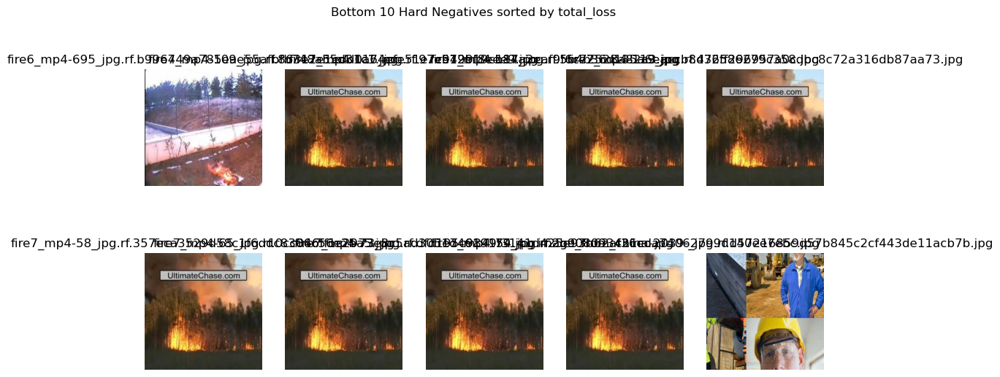

[INFO] Displaying Top 10 Hard Negatives sorted by loc_loss


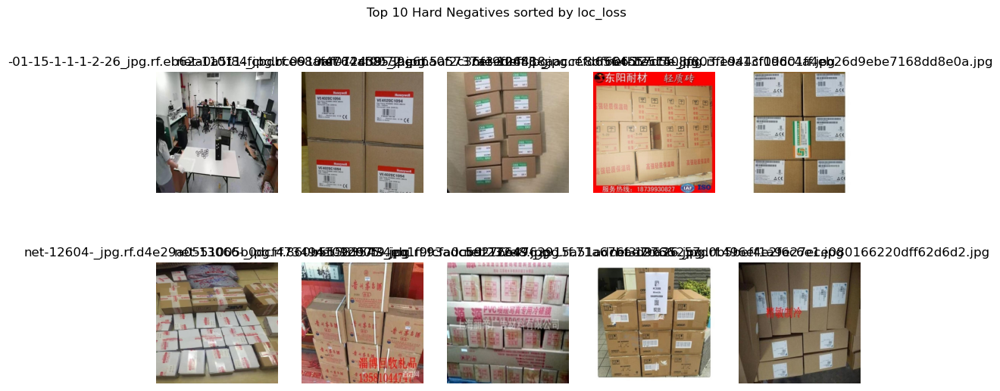

[INFO] Displaying Bottom 10 Hard Negatives sorted by loc_loss


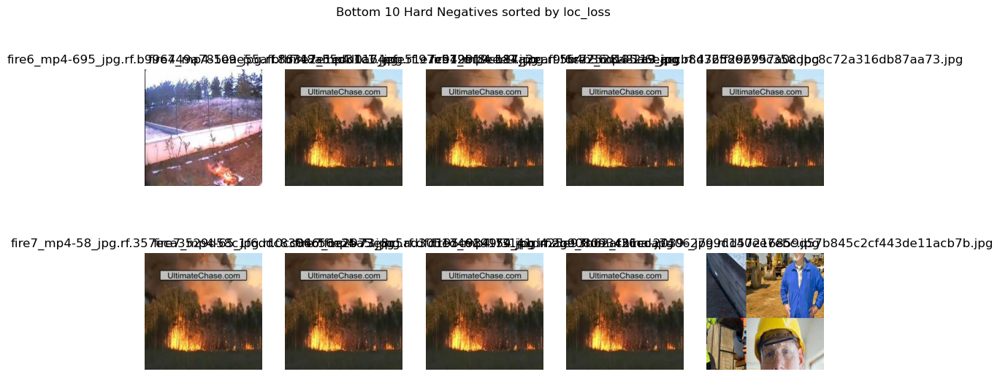

[INFO] Displaying Top 10 Hard Negatives sorted by conf_loss_obj


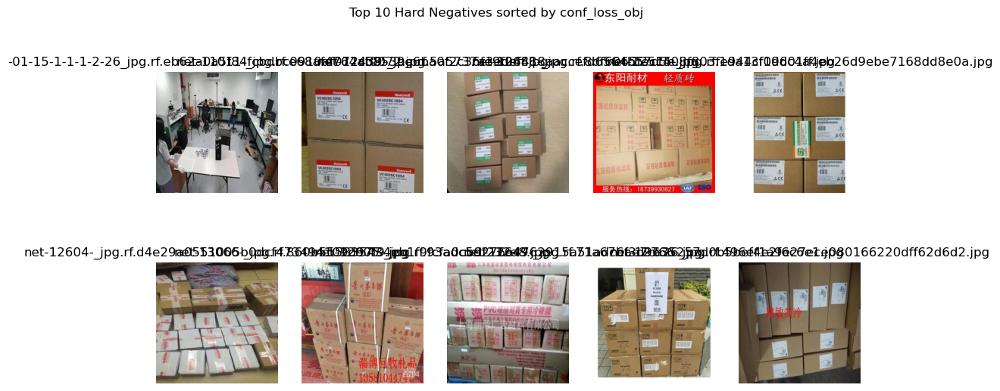

[INFO] Displaying Bottom 10 Hard Negatives sorted by conf_loss_obj


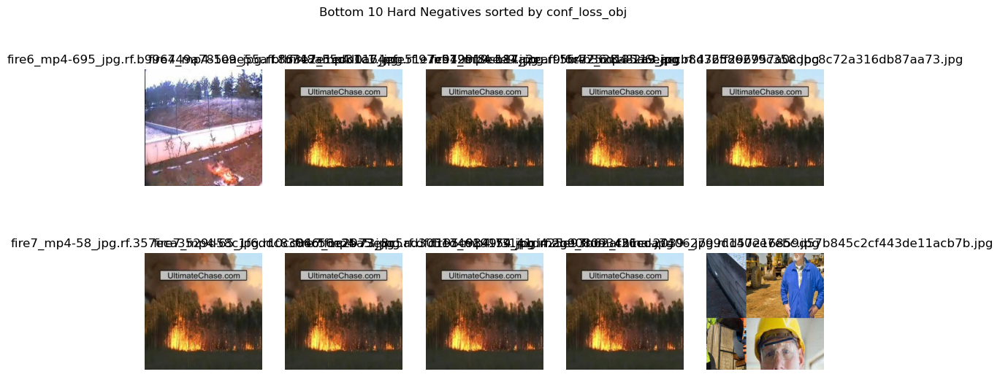

[INFO] Displaying Top 10 Hard Negatives sorted by class_loss


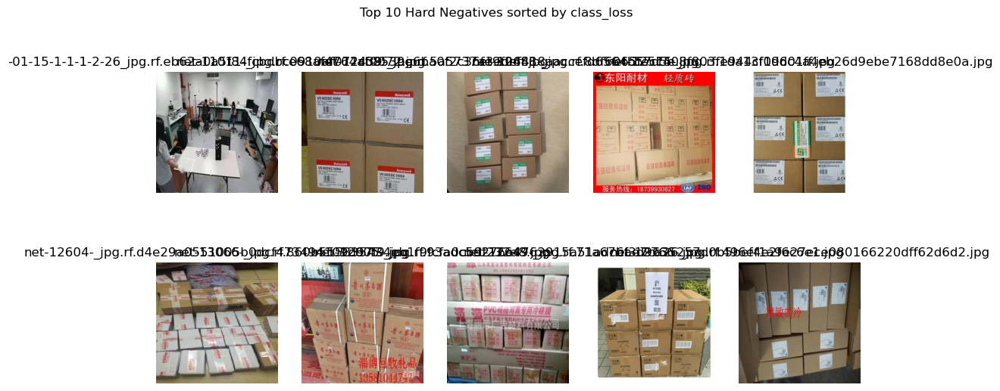

[INFO] Displaying Bottom 10 Hard Negatives sorted by class_loss


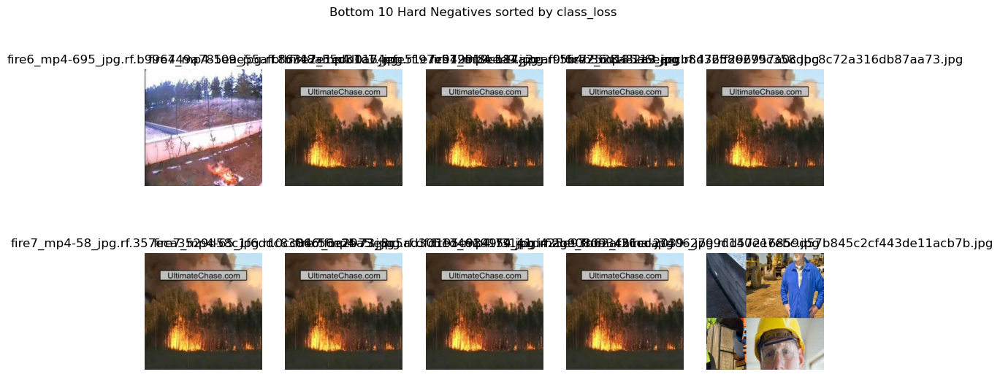

[INFO] Task C Analysis Complete.


In [9]:
# -------------------------------
# Task C: Hard Negative Selection Criteria
# -------------------------------

print("[INFO] Running Task C: Hard Negative Selection Criteria Analysis...")

# Ensure that baseline hard negatives are available.
# If the global dictionary 'hard_negative_results' does not have a 'default' key,
# then assign the locally computed 'hard_negatives' to it.
try:
    default_hard_negatives = hard_negative_results["default"]
except (NameError, KeyError):
    print("[WARNING] Default hard negatives not found in hard_negative_results. Using baseline 'hard_negatives' instead.")
    hard_negative_results = {}
    hard_negative_results["default"] = hard_negatives  # Use the baseline hard_negatives variable
    default_hard_negatives = hard_negatives

# Define the selection criteria variants
criteria_variants = ["total_loss", "loc_loss", "conf_loss_obj", "class_loss"]

for crit in criteria_variants:
    # Sort the default hard negatives by the current criterion (descending order)
    sorted_hard_negatives = default_hard_negatives.sort_values(by=crit, ascending=False)
    
    # Extract the top 10 and bottom 10 hard negatives
    top_10 = sorted_hard_negatives.head(10)
    bottom_10 = sorted_hard_negatives.tail(10)
    
    # Display the top 10 images
    print(f"[INFO] Displaying Top 10 Hard Negatives sorted by {crit}")
    display_images(top_10["image_file"].tolist(),
                   title=f"Top 10 Hard Negatives sorted by {crit}")
    
    # Display the bottom 10 images
    print(f"[INFO] Displaying Bottom 10 Hard Negatives sorted by {crit}")
    display_images(bottom_10["image_file"].tolist(),
                   title=f"Bottom 10 Hard Negatives sorted by {crit}")

print("[INFO] Task C Analysis Complete.")


#### Observations:

When we rank hard negatives by different loss components, we’re essentially asking which mistakes are the most problematic from various perspectives. For example:

- **Total Loss:**  
  Ranking by total_loss gives you the overall worst-performing negatives. The top 10 here are the false positives that, in aggregate, suffer from a combination of poor localization, high objectness confidence, and misclassification. In contrast, the bottom 10 negatives (i.e. those with lower total loss) might be less problematic overall—even if they are still false positives—and might have only minor issues in one or two areas.

- **Localization Loss (loc_loss):**  
  When ranking by loc_loss, you’re focusing solely on how far off the predicted bounding boxes are from the ground truth. The top 10 hard negatives in this category will be those with extreme localization errors (e.g. bounding boxes that are wildly misaligned), regardless of how confident the model was or whether it misclassified the object. The bottom 10, on the other hand, will be negatives that are relatively well localized—even though they may be false positives, their box coordinates are not the main issue.

- **Objectness/Confidence Loss (conf_loss_obj):**  
  Ranking by conf_loss_obj isolates the error due to the confidence score. The top 10 here will be detections where the model is highly confident about an object’s presence despite there being none. These are the “overconfident” false positives, which can be particularly problematic for overall model calibration. The bottom 10 hard negatives in this ranking will be detections with low confidence scores, indicating that while they are negatives, the model is appropriately uncertain about them.

- **Classification Loss (class_loss):**  
  Finally, when ranked by class_loss, you’re examining cases where the predicted class is far off from the true class label. The top 10 hard negatives by class_loss are those in which the model is making significant classification errors—perhaps confusing one object with another or assigning a random class—even if the localization or confidence might be acceptable. The bottom 10 in this ranking are negatives where the classification error is minimal, meaning the model might correctly recognize the lack of a true object or be only slightly uncertain about its class.

By displaying the top and bottom 10 hard negatives for each criterion, you gain insight into which aspects of your model’s errors are most severe. This multi-faceted analysis can then guide targeted improvements—for example, refining the localization strategy if loc_loss is consistently high, or recalibrating confidence scores if conf_loss_obj dominates the errors.